# Customer Lifetime Value Prediction

Customer Lifetime Value represents a customer’s value to a company over a period of time. It’s a competitive market for insurance companies in 2019, and insurance premium isn’t the only determining factor in a customer’s decisions. CLV is a customer-centric metric, and a powerful base to build upon to retain valuable customers, increase revenue from less valuable customers, and improve the customer experience overall.

### Business Problem

An Auto Insurance company in the USA is facing issues in retaining its customers and wants to advertise promotional offers for its loyal customers. They are considering Customer Lifetime Value CLV as a parameter for this purpose. Customer Lifetime Value represents a customer’s value to a company over a period of time. It’s a competitive market for insurance companies, and the insurance premium isn’t the only determining factor in a customer’s decisions. CLV is a customer-centric metric, and a powerful base to build upon to retain valuable customers, increase revenue from less valuable customers, and improve the customer experience overall. Using CLV effectively can improve customer acquisition and customer retention, prevent churn, help the company to plan its marketing budget, measure the performance of their ads in more detail, and much more.

### Project Overview

The objective of the problem is to accurately predict the Customer Lifetime Value(CLV) of the customer for an Auto Insurance Company
Performed EDA to understand the relation of target variable CLV with the other features.
Statistical Analysis techniques like OLS for numerical and Mann–Whitney U and also Kruskal Wallis test for the categorical variables were performed to find the significance of the features with respect to the target.
Supervised Regression Models like Linear Regression, Ridge Regression, Lasso Regression, DecisionTree Regression, Random Forest Regression and Adaboost Regression.
Using GridSearchCV with Random Forest Regression gave the best RMSE and R^2 score values

Dataset Description

The dataset represents Customer lifetime value of an Auto Insurance Company in the United States, it includes over 24 features and 9134 records to analyze the lifetime value of Customer.

DATASET:-
https://docs.google.com/spreadsheets/d/1cltj1nQA2hSM_-BJ2b7S1afMV78hKj9ygd4_P-Aqjqk/edit?usp=sharing 


In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings("ignore")
import seaborn as sns
pd.set_option("display.max_columns",None)
pd.set_option("display.max_rows",None)

#import models
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.svm import SVR
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor

#import models from ensemble
from sklearn.ensemble import AdaBoostRegressor, GradientBoostingRegressor, RandomForestRegressor

from sklearn.metrics import  accuracy_score, mean_squared_error, r2_score
from math import sqrt

In [2]:
df = pd.read_csv('https://raw.githubusercontent.com/nanthasnk/Customer-Lifetime-Value-Prediction/master/Data/AutoInsurance.csv')

In [3]:
df

,Customer,State,Customer Lifetime Value,Response,Coverage,Education,Effective To Date,EmploymentStatus,Gender,Income,Location Code,Marital Status,Monthly Premium Auto,Months Since Last Claim,Months Since Policy Inception,Number of Open Complaints,Number of Policies,Policy Type,Policy,Renew Offer Type,Sales Channel,Total Claim Amount,Vehicle Class,Vehicle Size
0,BU79786,Washington,2763.519279,No,Basic,Bachelor,2/24/11,Employed,F,56274,Suburban,Married,69,32,5,0,1,Corporate Auto,Corporate L3,Offer1,Agent,384.811147,Two-Door Car,Medsize
1,QZ44356,Arizona,6979.535903,No,Extended,Bachelor,1/31/11,Unemployed,F,0,Suburban,Single,94,13,42,0,8,Personal Auto,Personal L3,Offer3,Agent,1131.464935,Four-Door Car,Medsize
2,AI49188,Nevada,12887.431650,No,Premium,Bachelor,2/19/11,Employed,F,48767,Suburban,Married,108,18,38,0,2,Personal Auto,Personal L3,Offer1,Agent,566.472247,Two-Door Car,Medsize
3,WW63253,California,7645.861827,No,Basic,Bachelor,1/20/11,Unemployed,M,0,Suburban,Married,106,18,65,0,7,Corporate Auto,Corporate L2,Offer1,Call Center,529.881344,SUV,Medsize
4,HB64268,Washington,2813.692575,No,Basic,Bachelor,3/2/2011,Employed,M,43836,Rural,Single,73,12,44,0,1,Personal Auto,Personal L1,Offer1,Agent,138.130879,Four-Door Car,Medsize
5,OC83172,Oregon,8256.297800,Yes,Basic,Bachelor,1/25/11,Employed,F,62902,Rural,Married,69,14,94,0,2,Personal Auto,Personal L3,Offer2,Web,159.383042,Two-Door Car,Medsize
6,XZ87318,Oregon,5380.898636,Yes,Basic,College,2/24/11,Employed,F,55350,Suburban,Married,67,0,13,0,9,Corporate Auto,Corporate L3,Offer1,Agent,321.600000,Four-Door Car,Medsize
7,CF85061,Arizona,7216.100311,No,Premium,Master,1/18/11,Unemployed,M,0,Urban,Single,101,0,68,0,4,Corporate Auto,Corporate L3,Offer1,Agent,363.029680,Four-Door Car,Medsize
8,DY87989,Oregon,24127.504020,Yes,Basic,Bachelor,1/26/11,Medical Leave,M,14072,Suburban,Divorced,71,13,3,0,2,Corporate Auto,Corporate L3,Offer1,Agent,511.200000,Four-Door Car,Medsize
9,BQ94931,Oregon,7388.178085,No,Extended,College,2/17/11,Employed,F,28812,Urban,Married,93,17,7,0,8,Special Auto,Special L2,Offer2,Branch,425.527834,Four-Door Car,Medsize


In [4]:
df.shape

(9134, 24)

In [5]:
df.describe()

,Customer Lifetime Value,Income,Monthly Premium Auto,Months Since Last Claim,Months Since Policy Inception,Number of Open Complaints,Number of Policies,Total Claim Amount
count,9134.000000,9134.000000,9134.000000,9134.000000,9134.000000,9134.000000,9134.000000,9134.000000
mean,8004.940475,37657.380009,93.219291,15.097000,48.064594,0.384388,2.966170,434.088794
std,6870.967608,30379.904734,34.407967,10.073257,27.905991,0.910384,2.390182,290.500092
min,1898.007675,0.000000,61.000000,0.000000,0.000000,0.000000,1.000000,0.099007
25%,3994.251794,0.000000,68.000000,6.000000,24.000000,0.000000,1.000000,272.258244
50%,5780.182197,33889.500000,83.000000,14.000000,48.000000,0.000000,2.000000,383.945434
75%,8962.167041,62320.000000,109.000000,23.000000,71.000000,0.000000,4.000000,547.514839
max,83325.381190,99981.000000,298.000000,35.000000,99.000000,5.000000,9.000000,2893.239678


In [6]:
df.isnull().sum()

Customer                         0
State                            0
Customer Lifetime Value          0
Response                         0
Coverage                         0
Education                        0
Effective To Date                0
EmploymentStatus                 0
Gender                           0
Income                           0
Location Code                    0
Marital Status                   0
Monthly Premium Auto             0
Months Since Last Claim          0
Months Since Policy Inception    0
Number of Open Complaints        0
Number of Policies               0
Policy Type                      0
Policy                           0
Renew Offer Type                 0
Sales Channel                    0
Total Claim Amount               0
Vehicle Class                    0
Vehicle Size                     0
dtype: int64

### We can see that no null values are present in the dataset

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9134 entries, 0 to 9133
Data columns (total 24 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   Customer                       9134 non-null   object 
 1   State                          9134 non-null   object 
 2   Customer Lifetime Value        9134 non-null   float64
 3   Response                       9134 non-null   object 
 4   Coverage                       9134 non-null   object 
 5   Education                      9134 non-null   object 
 6   Effective To Date              9134 non-null   object 
 7   EmploymentStatus               9134 non-null   object 
 8   Gender                         9134 non-null   object 
 9   Income                         9134 non-null   int64  
 10  Location Code                  9134 non-null   object 
 11  Marital Status                 9134 non-null   object 
 12  Monthly Premium Auto           9134 non-null   i

### Lets visualize numerical columns

### In the above cell we can see that in the dataset we are having numeric columns and object columns

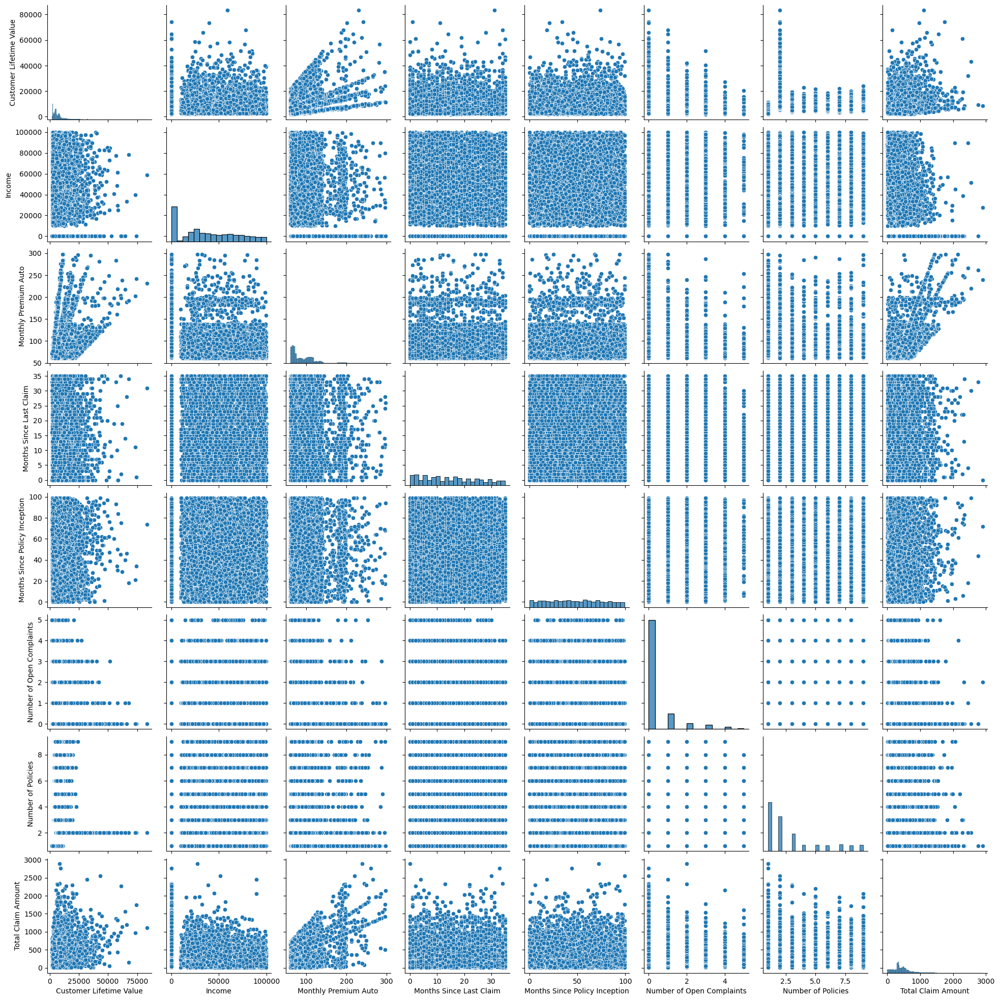

In [8]:
sns.pairplot(df)

In [9]:
numeric_columns= df.select_dtypes("number")
numeric_columns.shape

(9134, 8)

Axes(0.125,0.11;0.775x0.77)


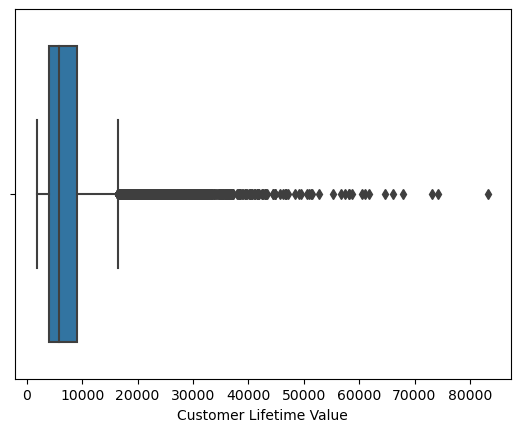

Axes(0.125,0.11;0.775x0.77)


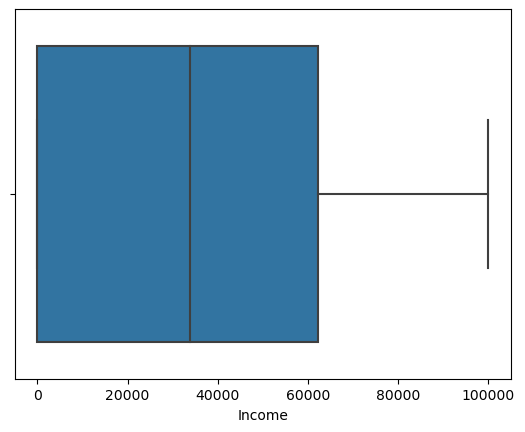

Axes(0.125,0.11;0.775x0.77)


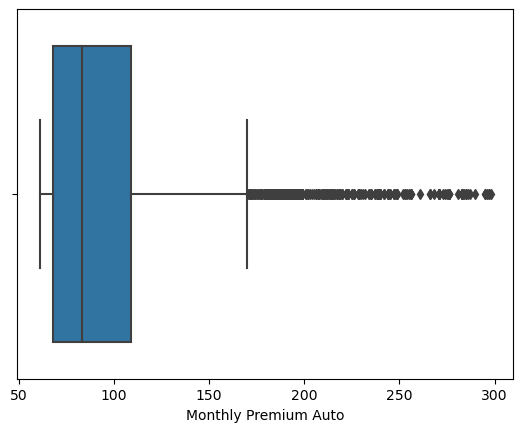

Axes(0.125,0.11;0.775x0.77)


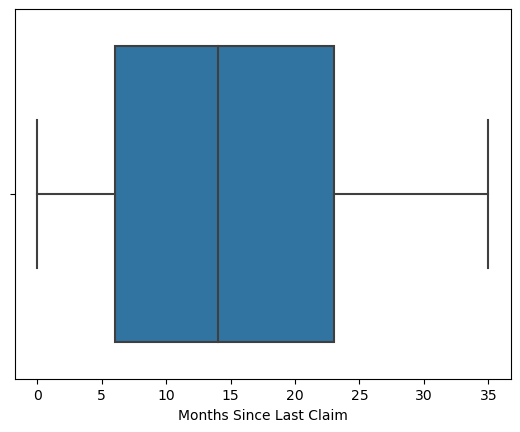

Axes(0.125,0.11;0.775x0.77)


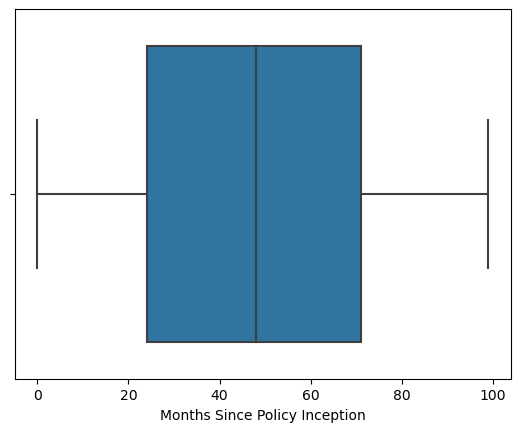

Axes(0.125,0.11;0.775x0.77)


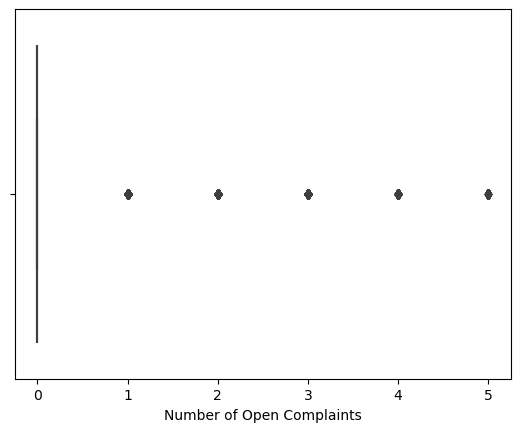

Axes(0.125,0.11;0.775x0.77)


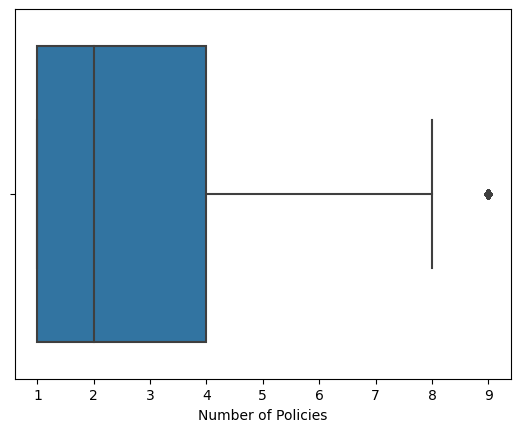

Axes(0.125,0.11;0.775x0.77)


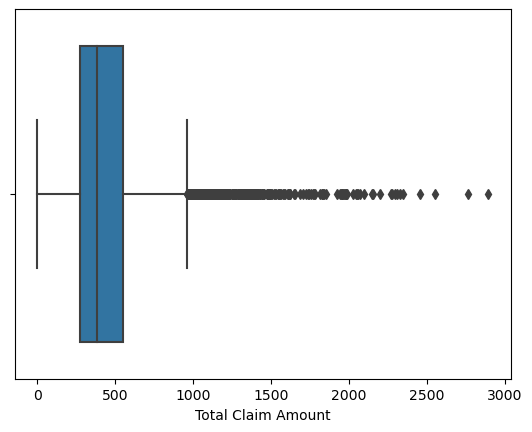

In [10]:

for i in df.select_dtypes("number").columns:
    print(sns.boxplot(x=df[i],data=df))
    plt.show()



### lets calculate outliers in each column

In [11]:
for i in numeric_columns:
    q1=df[i].quantile(0.25)
    q3=df[i].quantile(0.75)
    IQR=q3-q1
    lower_value=q1-(1.5 * IQR)
    higher_value= q3 + (1.5 * IQR)
    count=df[df[i] < lower_value].shape[0]
    count+=df[df[i]> higher_value].shape[0]
    if count>1:
        print(f"outliers percentage in {i}: ",count/df[i].shape[0]*100)

outliers percentage in Customer Lifetime Value:  8.944602583753012
outliers percentage in Monthly Premium Auto:  4.707685570396322
outliers percentage in Number of Open Complaints:  20.604335449967156
outliers percentage in Number of Policies:  4.554412086708999
outliers percentage in Total Claim Amount:  4.959492007882636


### We can see that there are outliers in some columns like customer lifetime value, monthly premium auto, no of open complaints, number of policies and total claim amount
### but we cannot remove those outliers as they are the loyal customers so we proceed with the outliers

### --------------------------------------------------------------------------------------------------------------------------------------------------------------

## Lets plot distplot to check the skewness

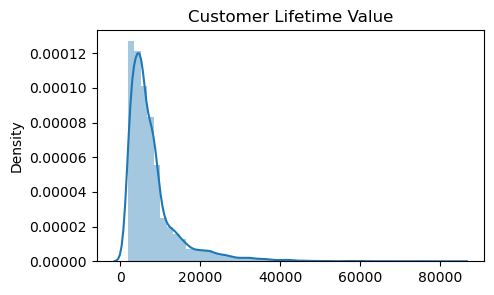

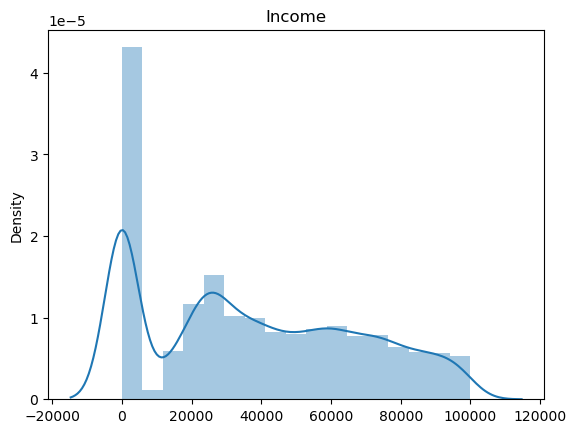

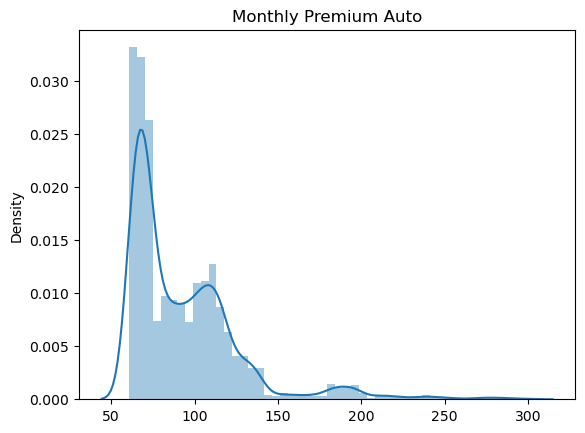

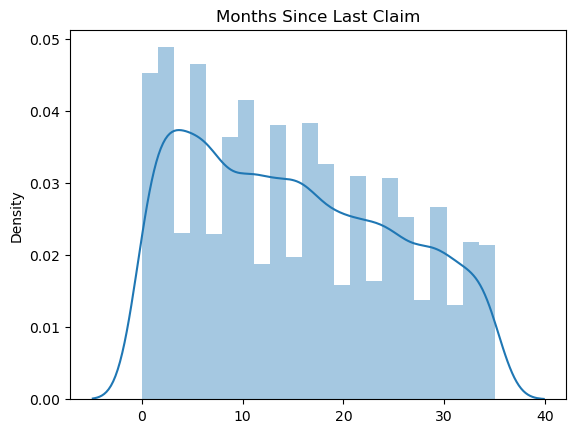

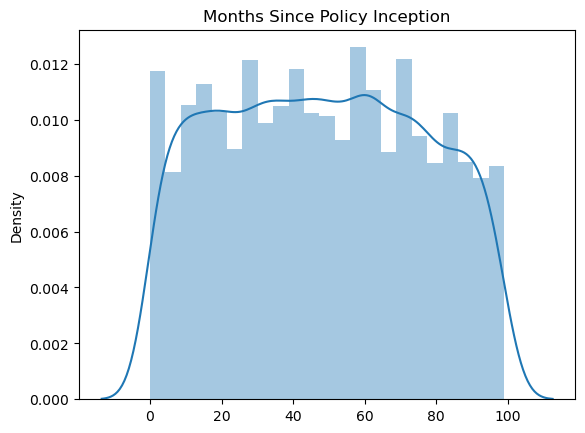

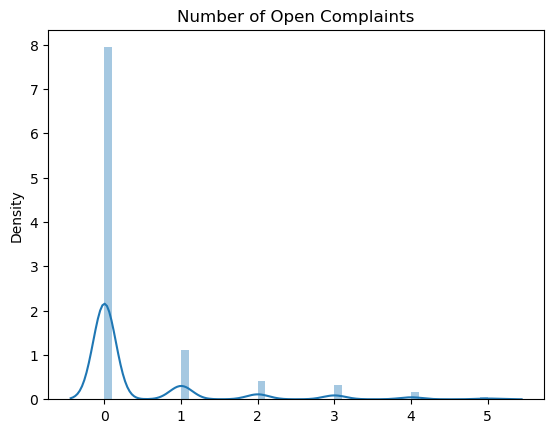

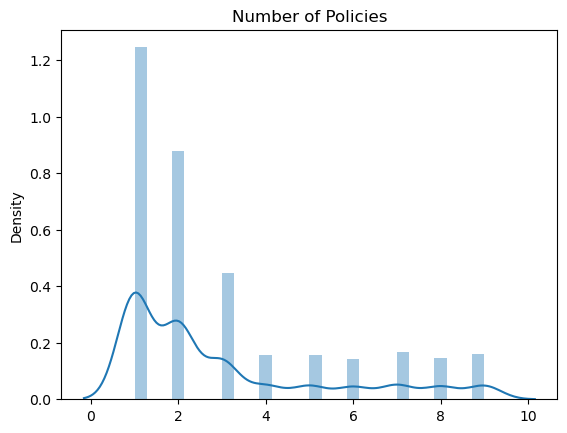

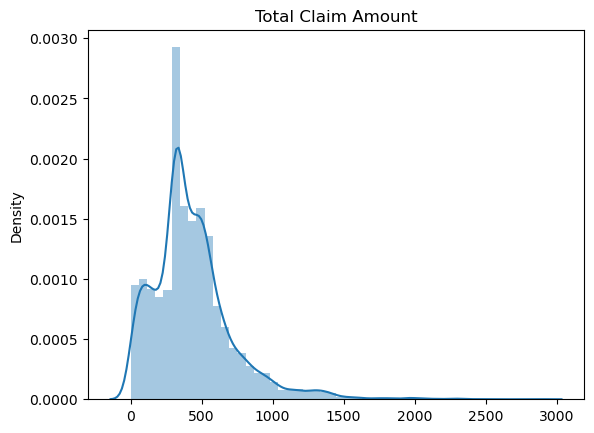

In [12]:
plt.figure(figsize=(5,3))
for i in df.select_dtypes("number").columns:
    sns.distplot(x=df[i])
    plt.title(i)
    plt.show()

### There is skewness present in the columns

In [13]:
### we can see that there are most of the custers with only 1 policy
df["Number of Policies"].value_counts()

1    3251
2    2294
3    1168
7     433
9     416
4     409
5     407
8     384
6     372
Name: Number of Policies, dtype: int64

### Lets visualize categorical columns

In [14]:
categorical_columns= df.select_dtypes("object")

In [15]:
categorical_columns.head()

,Customer,State,Response,Coverage,Education,Effective To Date,EmploymentStatus,Gender,Location Code,Marital Status,Policy Type,Policy,Renew Offer Type,Sales Channel,Vehicle Class,Vehicle Size
0,BU79786,Washington,No,Basic,Bachelor,2/24/11,Employed,F,Suburban,Married,Corporate Auto,Corporate L3,Offer1,Agent,Two-Door Car,Medsize
1,QZ44356,Arizona,No,Extended,Bachelor,1/31/11,Unemployed,F,Suburban,Single,Personal Auto,Personal L3,Offer3,Agent,Four-Door Car,Medsize
2,AI49188,Nevada,No,Premium,Bachelor,2/19/11,Employed,F,Suburban,Married,Personal Auto,Personal L3,Offer1,Agent,Two-Door Car,Medsize
3,WW63253,California,No,Basic,Bachelor,1/20/11,Unemployed,M,Suburban,Married,Corporate Auto,Corporate L2,Offer1,Call Center,SUV,Medsize
4,HB64268,Washington,No,Basic,Bachelor,3/2/2011,Employed,M,Rural,Single,Personal Auto,Personal L1,Offer1,Agent,Four-Door Car,Medsize


In [16]:
categorical_columns.shape

(9134, 16)

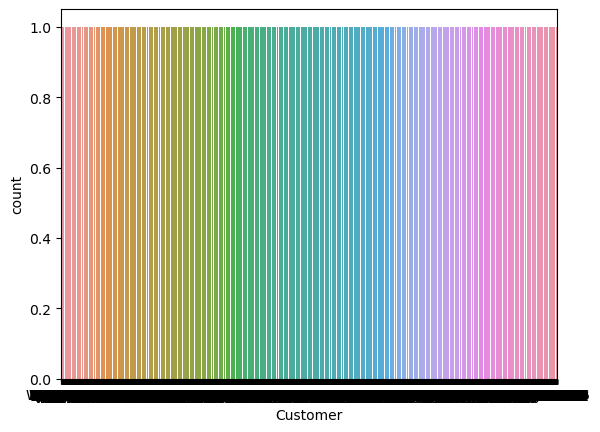

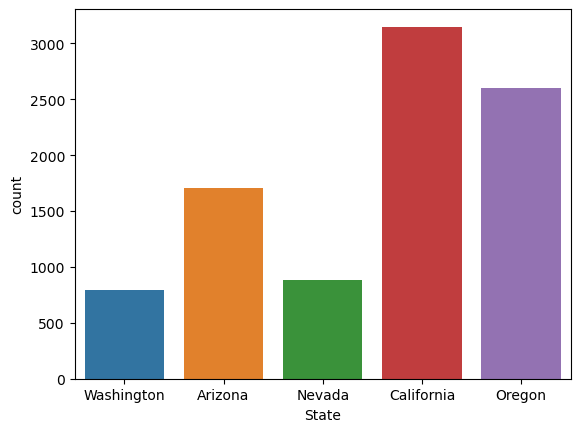

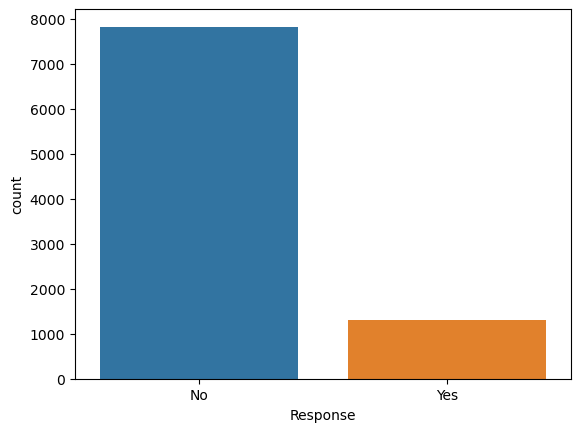

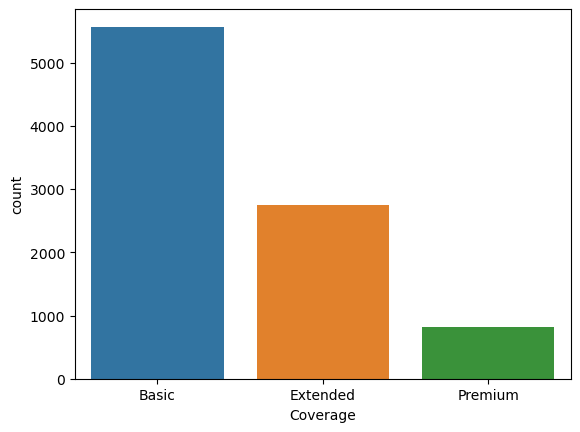

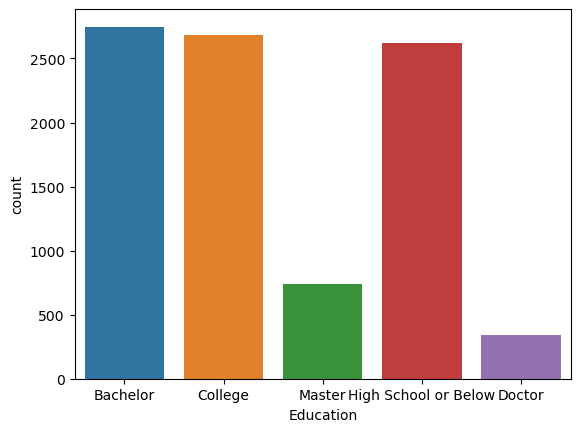

...

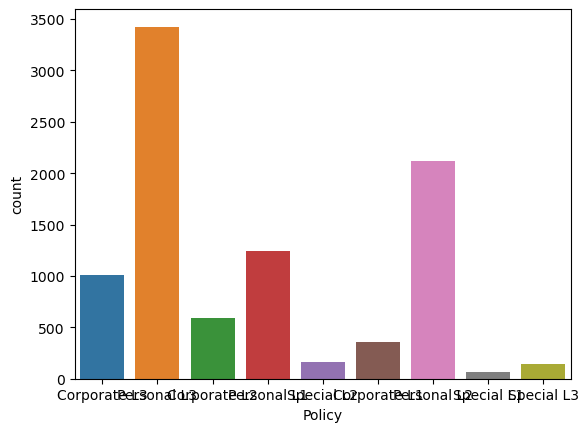

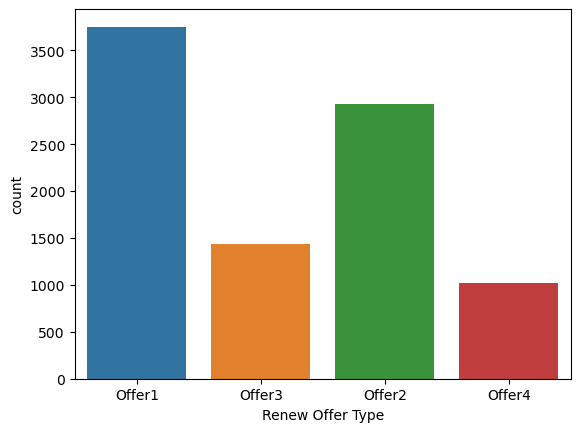

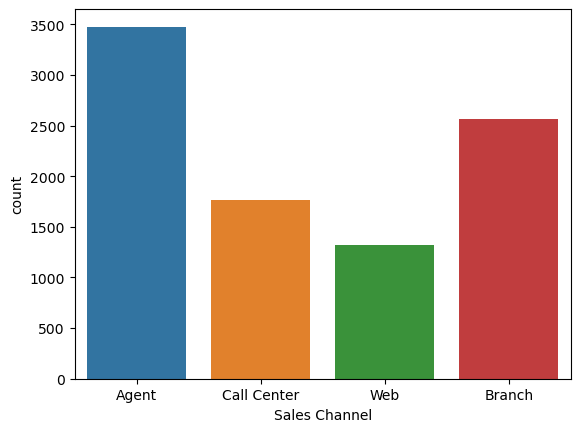

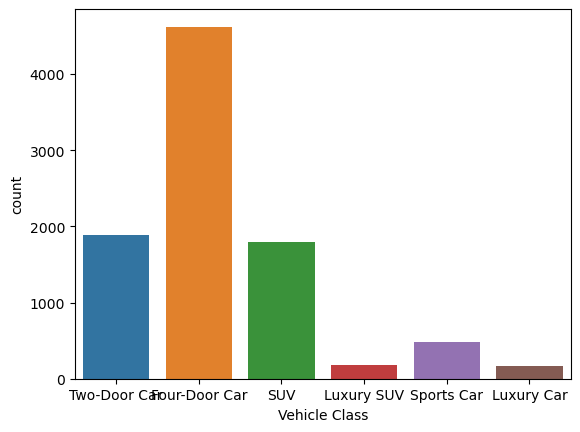

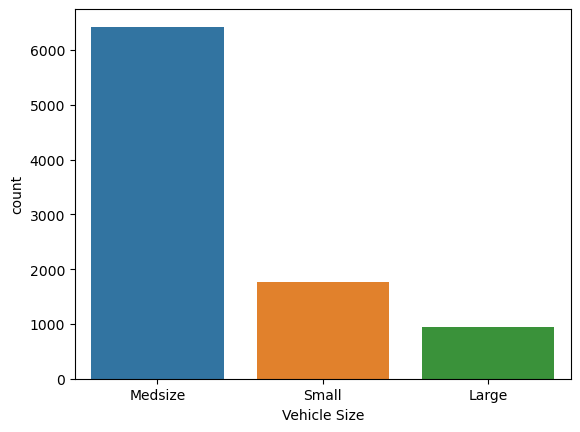

In [17]:
for i in categorical_columns.columns:
    sns.countplot(x=categorical_columns[i], data=categorical_columns)
    plt.show()

### As we can see that column customer and effective to date columns are not important so we will remove these 2 columns

In [18]:
categorical_columns.drop(categorical_columns[["Customer", "Effective To Date"]], axis =1, inplace= True)

In [19]:
categorical_columns.head()

,State,Response,Coverage,Education,EmploymentStatus,Gender,Location Code,Marital Status,Policy Type,Policy,Renew Offer Type,Sales Channel,Vehicle Class,Vehicle Size
0,Washington,No,Basic,Bachelor,Employed,F,Suburban,Married,Corporate Auto,Corporate L3,Offer1,Agent,Two-Door Car,Medsize
1,Arizona,No,Extended,Bachelor,Unemployed,F,Suburban,Single,Personal Auto,Personal L3,Offer3,Agent,Four-Door Car,Medsize
2,Nevada,No,Premium,Bachelor,Employed,F,Suburban,Married,Personal Auto,Personal L3,Offer1,Agent,Two-Door Car,Medsize
3,California,No,Basic,Bachelor,Unemployed,M,Suburban,Married,Corporate Auto,Corporate L2,Offer1,Call Center,SUV,Medsize
4,Washington,No,Basic,Bachelor,Employed,M,Rural,Single,Personal Auto,Personal L1,Offer1,Agent,Four-Door Car,Medsize


In [20]:
categorical_columns.shape

(9134, 14)

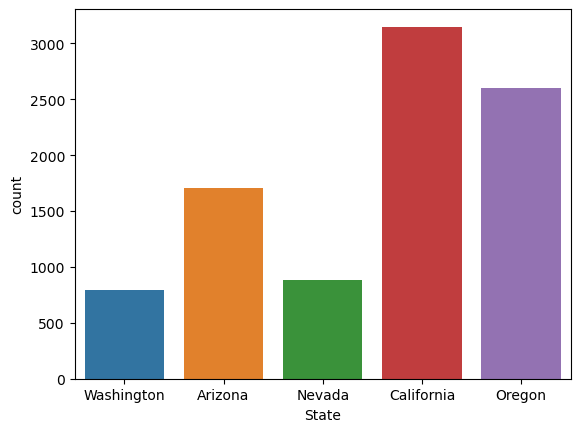

column :-  State
California    3150
Oregon        2601
Arizona       1703
Nevada         882
Washington     798
Name: State, dtype: int64


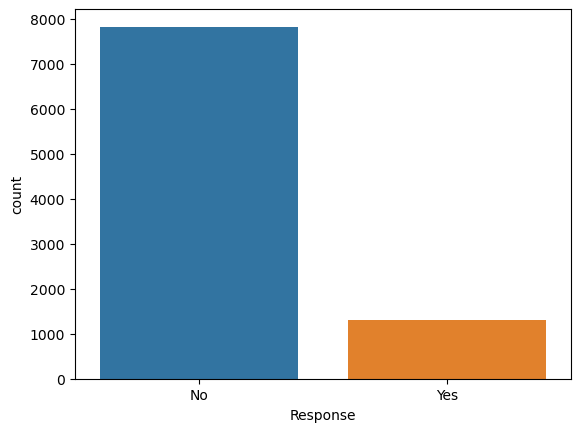

column :-  Response
No     7826
Yes    1308
Name: Response, dtype: int64


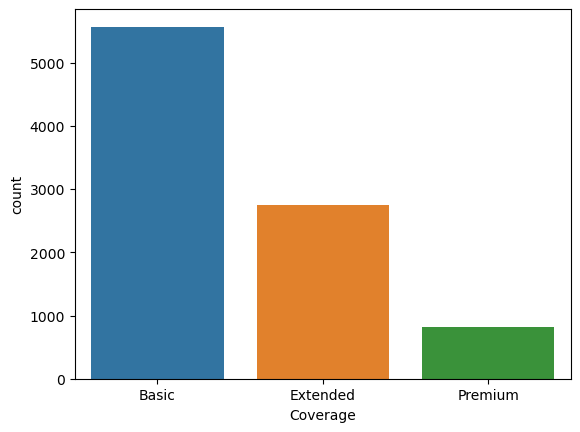

column :-  Coverage
Basic       5568
Extended    2742
Premium      824
Name: Coverage, dtype: int64


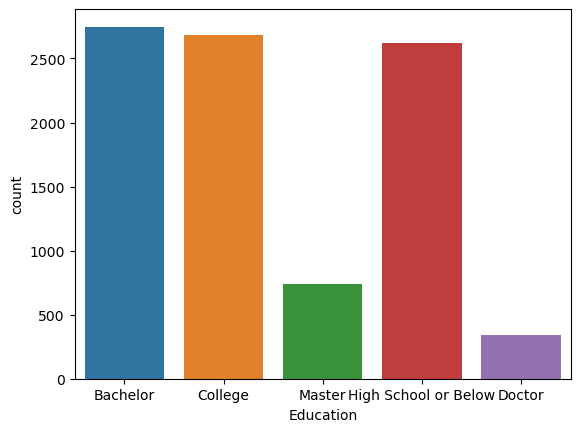

column :-  Education
Bachelor                2748
College                 2681
High School or Below    2622
Master                   741
Doctor                   342
Name: Education, dtype: int64


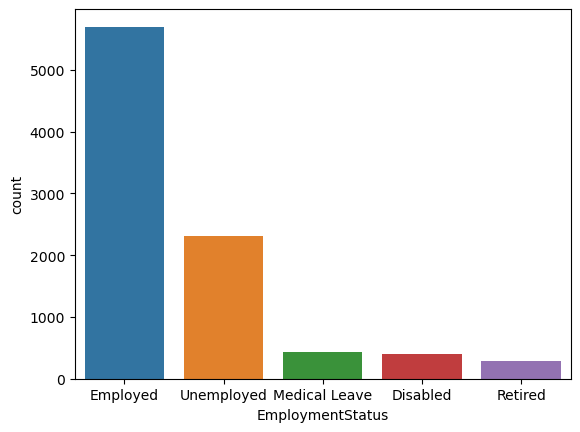

column :-  EmploymentStatus
Employed         5698
Unemployed       2317
Medical Leave     432
Disabled          405
Retired           282
Name: EmploymentStatus, dtype: int64


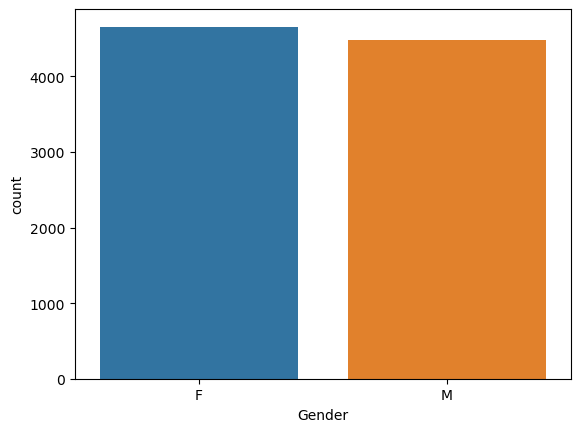

column :-  Gender
F    4658
M    4476
Name: Gender, dtype: int64


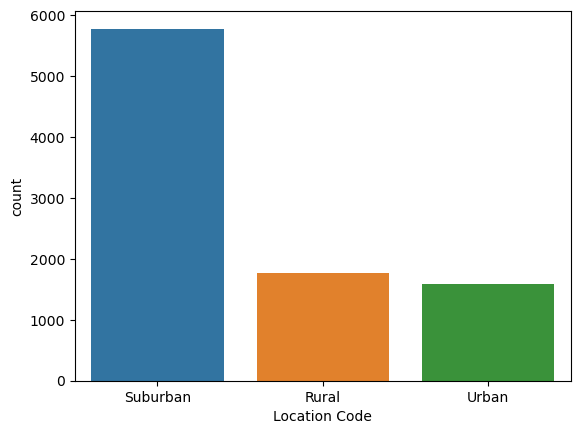

column :-  Location Code
Suburban    5779
Rural       1773
Urban       1582
Name: Location Code, dtype: int64


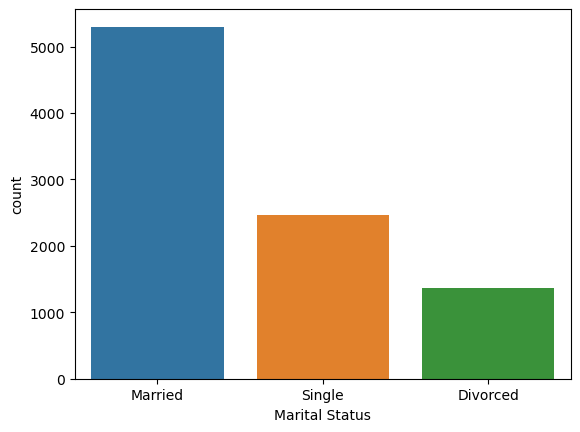

column :-  Marital Status
Married     5298
Single      2467
Divorced    1369
Name: Marital Status, dtype: int64


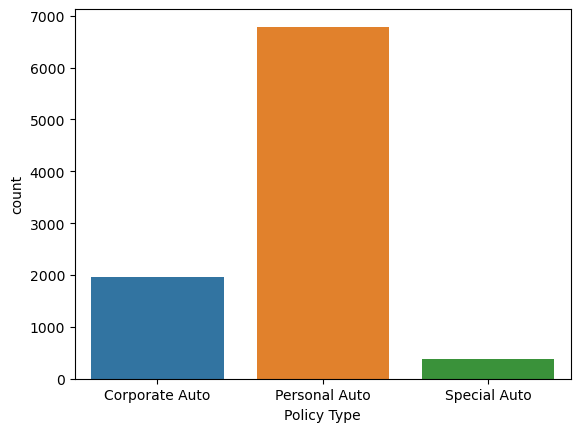

column :-  Policy Type
Personal Auto     6788
Corporate Auto    1968
Special Auto       378
Name: Policy Type, dtype: int64


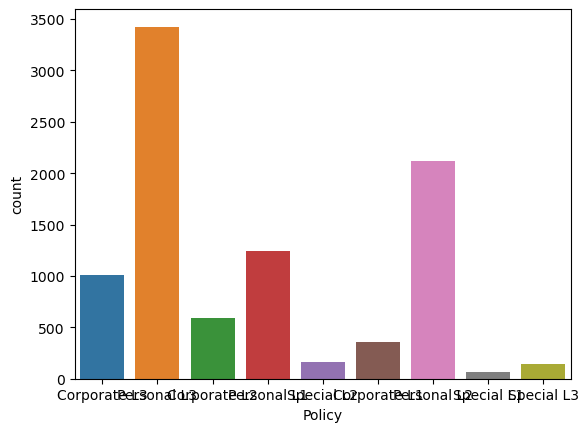

column :-  Policy
Personal L3     3426
Personal L2     2122
Personal L1     1240
Corporate L3    1014
Corporate L2     595
Corporate L1     359
Special L2       164
Special L3       148
Special L1        66
Name: Policy, dtype: int64


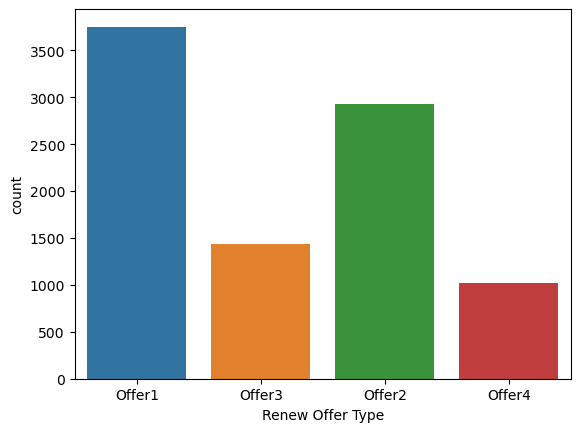

column :-  Renew Offer Type
Offer1    3752
Offer2    2926
Offer3    1432
Offer4    1024
Name: Renew Offer Type, dtype: int64


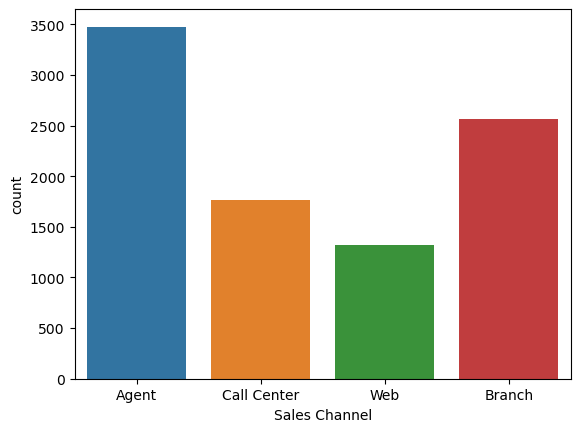

column :-  Sales Channel
Agent          3477
Branch         2567
Call Center    1765
Web            1325
Name: Sales Channel, dtype: int64


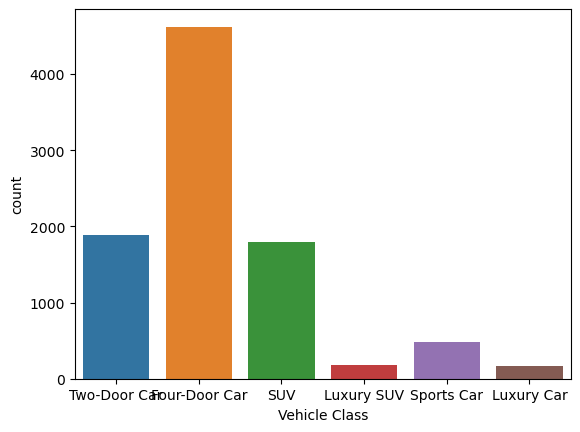

column :-  Vehicle Class
Four-Door Car    4621
Two-Door Car     1886
SUV              1796
Sports Car        484
Luxury SUV        184
Luxury Car        163
Name: Vehicle Class, dtype: int64


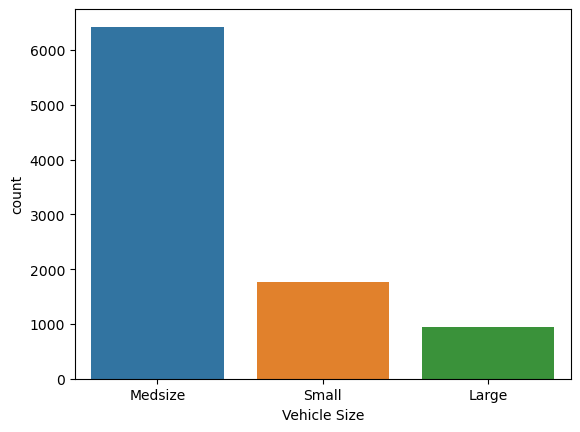

column :-  Vehicle Size
Medsize    6424
Small      1764
Large       946
Name: Vehicle Size, dtype: int64


In [21]:
for i in categorical_columns.columns:
    sns.countplot(x=categorical_columns[i], data=categorical_columns)
    plt.show()
    print("column :- ",i)
    print(categorical_columns[i].value_counts())

### Lets do bivariate

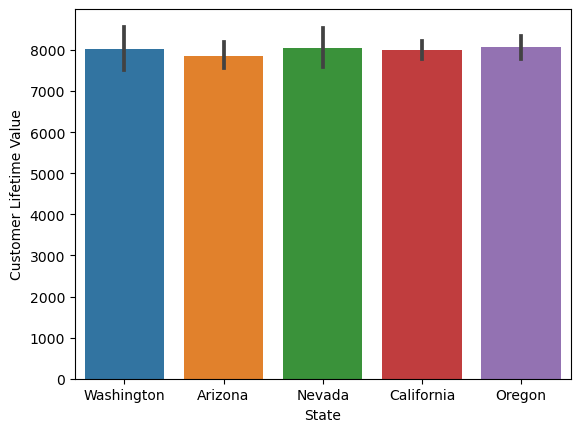

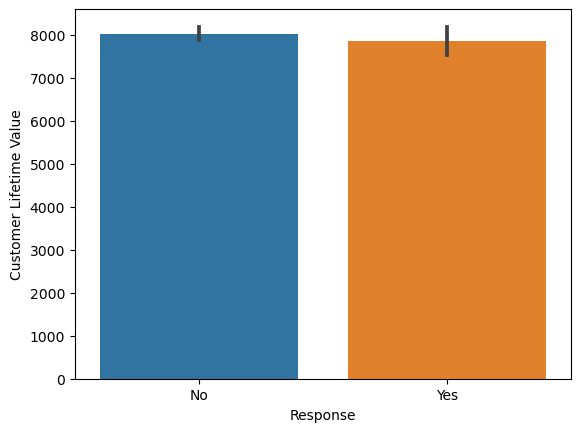

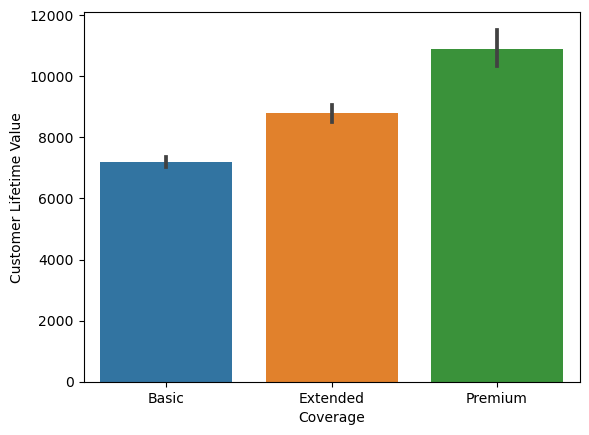

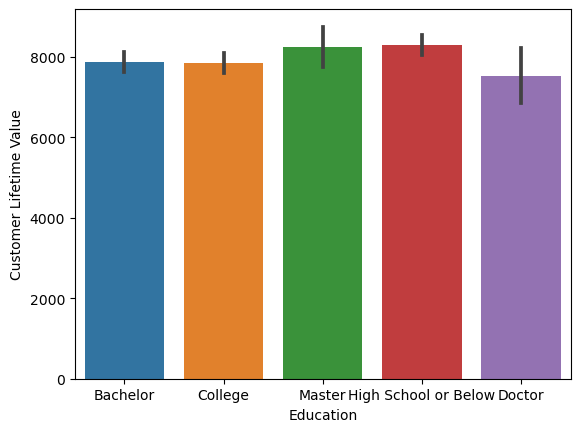

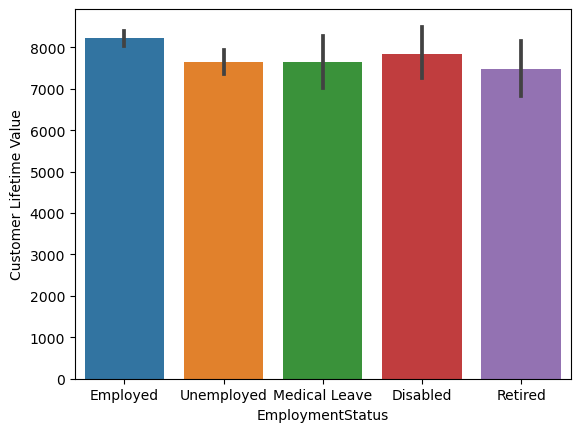

...

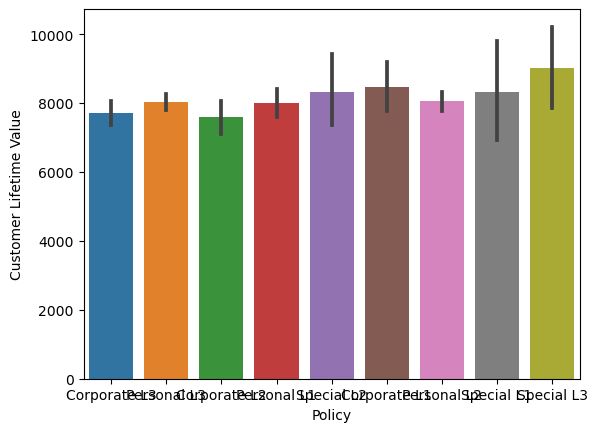

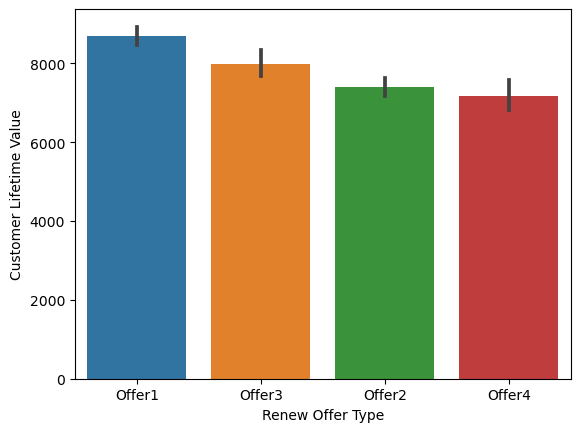

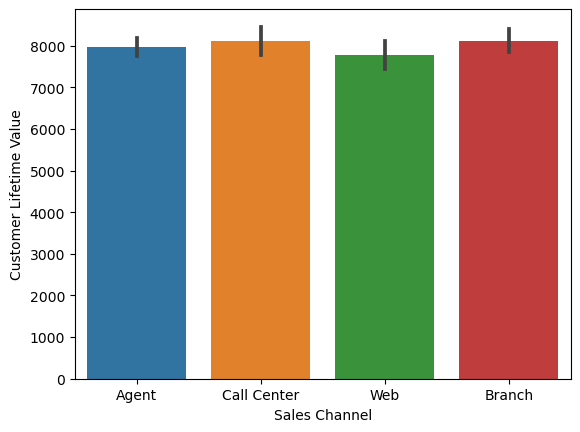

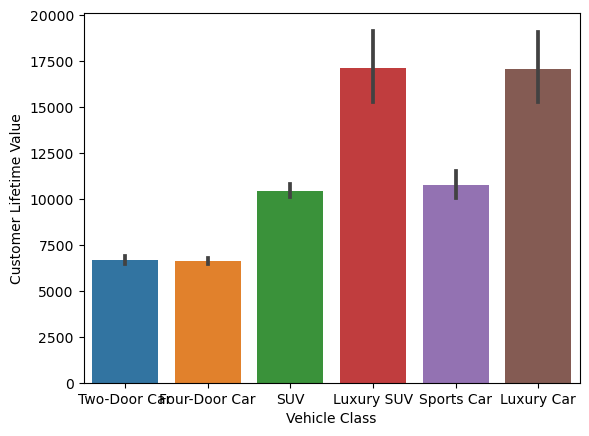

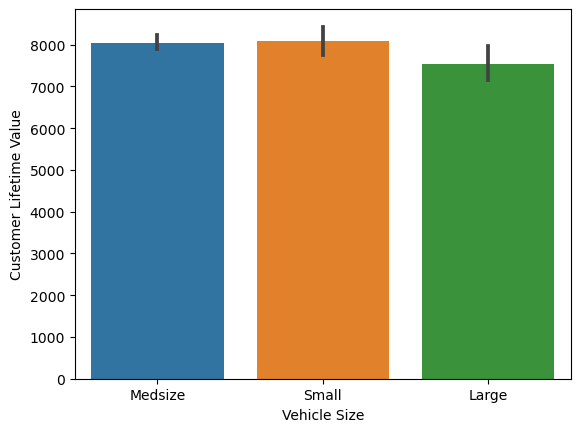

In [22]:
for i in categorical_columns:
    sns.barplot(x=categorical_columns[i], y=df["Customer Lifetime Value"])
    plt.show()

### lets check with employement status column as one of the parameter as there can be a link with respect to insurance policy

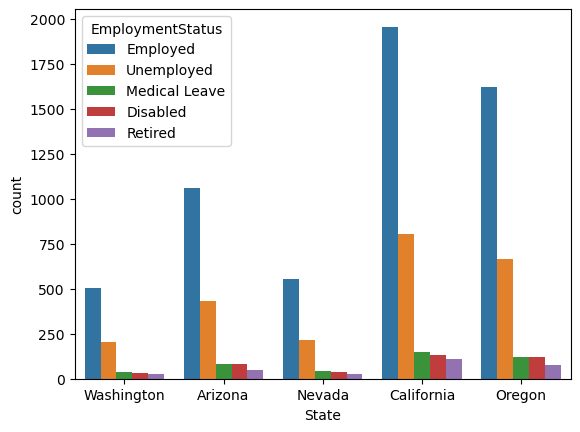

California    3150
Oregon        2601
Arizona       1703
Nevada         882
Washington     798
Name: State, dtype: int64


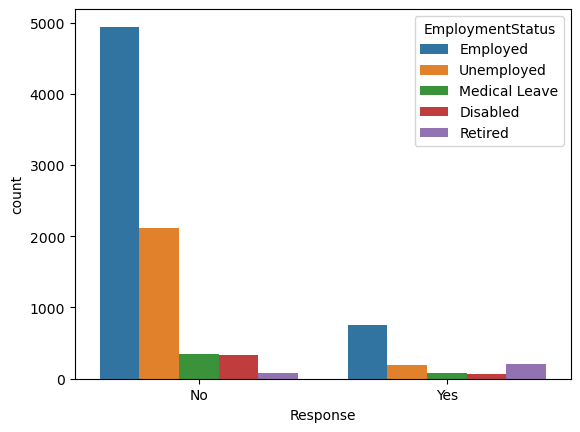

No     7826
Yes    1308
Name: Response, dtype: int64


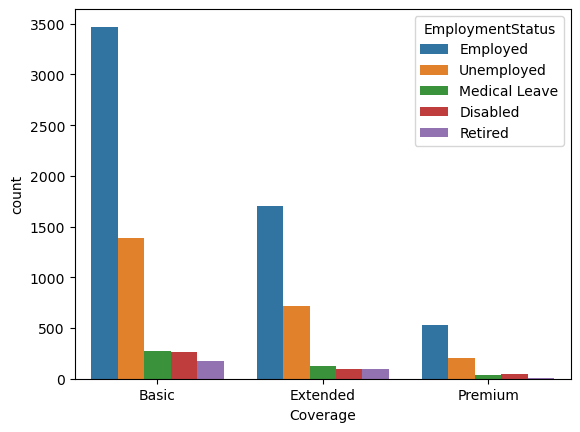

Basic       5568
Extended    2742
Premium      824
Name: Coverage, dtype: int64


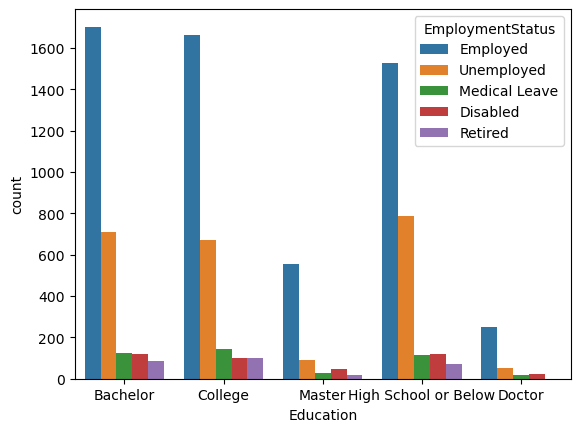

Bachelor                2748
College                 2681
High School or Below    2622
Master                   741
Doctor                   342
Name: Education, dtype: int64


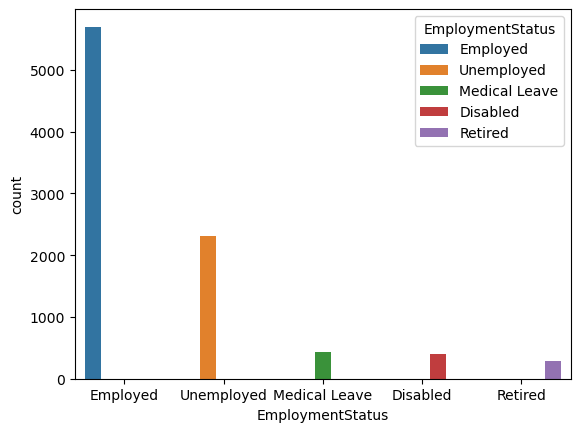

Employed         5698
Unemployed       2317
Medical Leave     432
Disabled          405
Retired           282
Name: EmploymentStatus, dtype: int64


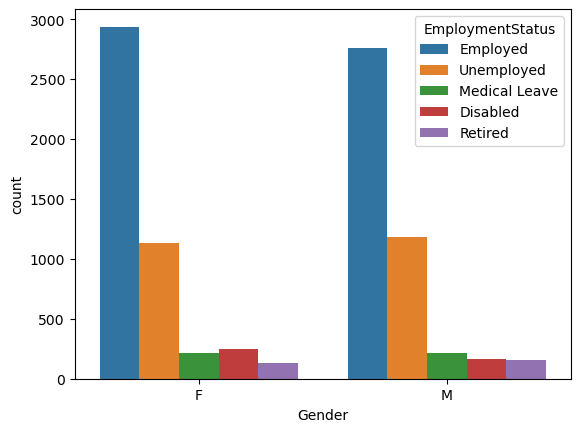

F    4658
M    4476
Name: Gender, dtype: int64


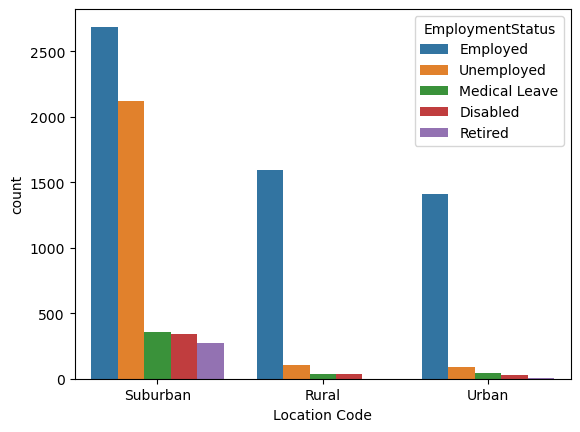

Suburban    5779
Rural       1773
Urban       1582
Name: Location Code, dtype: int64


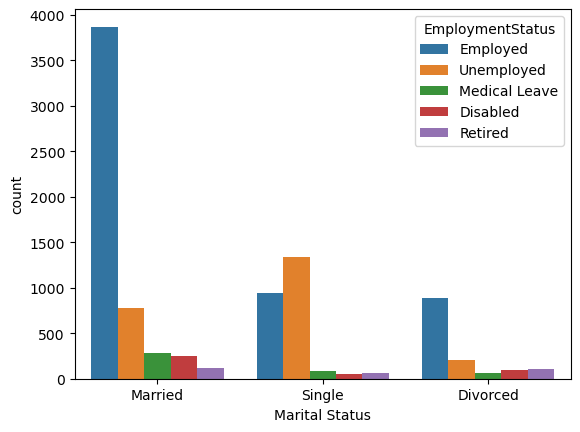

Married     5298
Single      2467
Divorced    1369
Name: Marital Status, dtype: int64


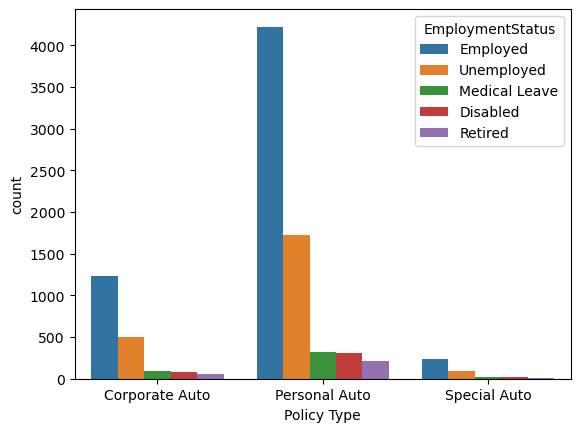

Personal Auto     6788
Corporate Auto    1968
Special Auto       378
Name: Policy Type, dtype: int64


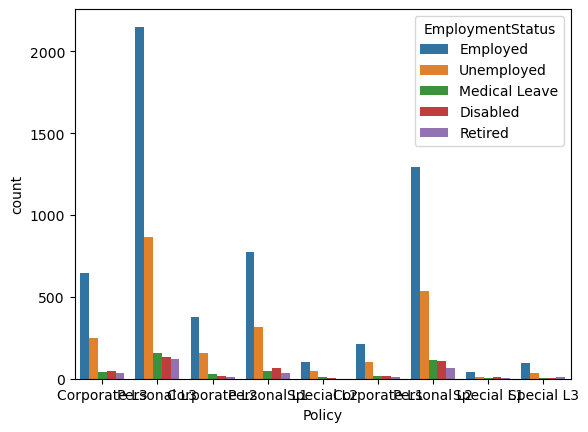

Personal L3     3426
Personal L2     2122
Personal L1     1240
Corporate L3    1014
Corporate L2     595
Corporate L1     359
Special L2       164
Special L3       148
Special L1        66
Name: Policy, dtype: int64


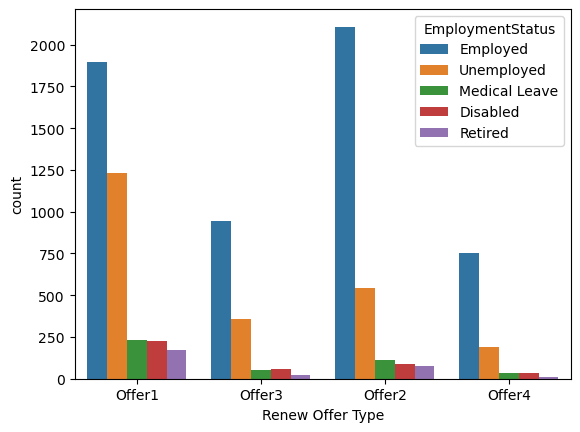

Offer1    3752
Offer2    2926
Offer3    1432
Offer4    1024
Name: Renew Offer Type, dtype: int64


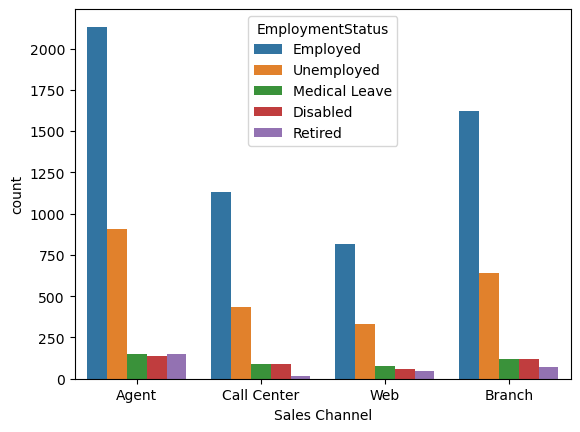

Agent          3477
Branch         2567
Call Center    1765
Web            1325
Name: Sales Channel, dtype: int64


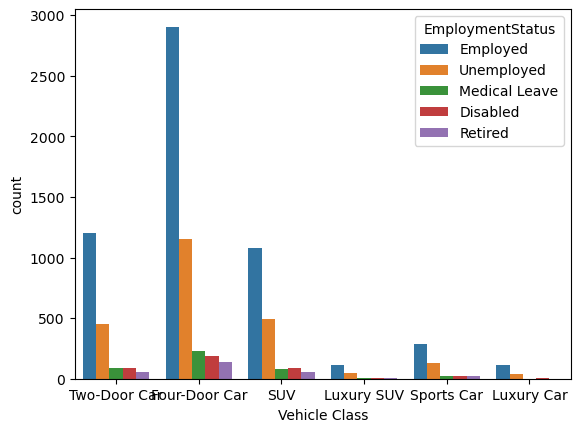

Four-Door Car    4621
Two-Door Car     1886
SUV              1796
Sports Car        484
Luxury SUV        184
Luxury Car        163
Name: Vehicle Class, dtype: int64


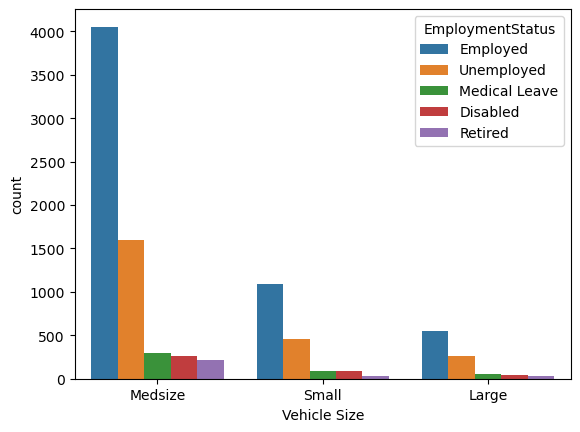

Medsize    6424
Small      1764
Large       946
Name: Vehicle Size, dtype: int64


In [23]:
for i in categorical_columns:
    sns.countplot(x=categorical_columns[i], hue=categorical_columns["EmploymentStatus"],data=categorical_columns)
    plt.show()
    print(categorical_columns[i].value_counts())

### As we can see that employed customers are present more in each figure

### lets check with the correlation 

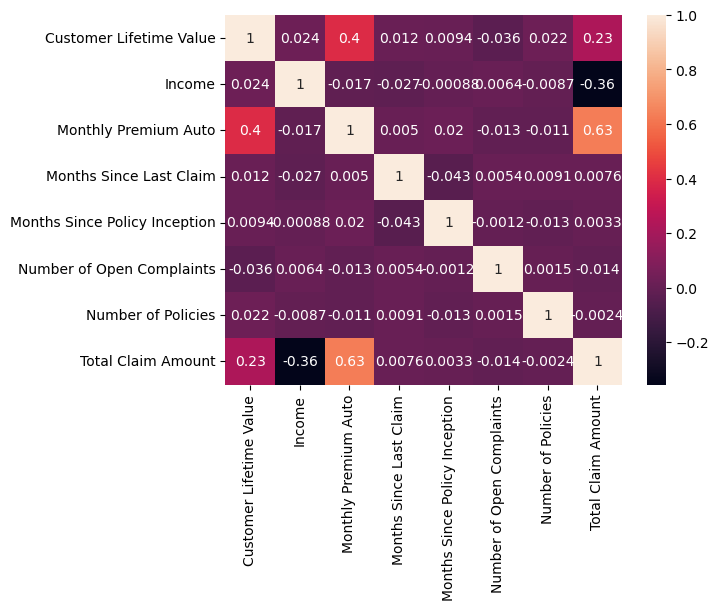

In [24]:
plt.figure.figsize=(8,14)
sns.heatmap(df.corr(), annot =True)
plt.show()

### we can see that correlation between customer lifetime value and monthly premium auto is higher(0.4) and also for monthly premium auto and total claim amount is 0.63  

#### done with the data visualixzation part, now lets move to the model building 

In [25]:
df.head()

,Customer,State,Customer Lifetime Value,Response,Coverage,Education,Effective To Date,EmploymentStatus,Gender,Income,Location Code,Marital Status,Monthly Premium Auto,Months Since Last Claim,Months Since Policy Inception,Number of Open Complaints,Number of Policies,Policy Type,Policy,Renew Offer Type,Sales Channel,Total Claim Amount,Vehicle Class,Vehicle Size
0,BU79786,Washington,2763.519279,No,Basic,Bachelor,2/24/11,Employed,F,56274,Suburban,Married,69,32,5,0,1,Corporate Auto,Corporate L3,Offer1,Agent,384.811147,Two-Door Car,Medsize
1,QZ44356,Arizona,6979.535903,No,Extended,Bachelor,1/31/11,Unemployed,F,0,Suburban,Single,94,13,42,0,8,Personal Auto,Personal L3,Offer3,Agent,1131.464935,Four-Door Car,Medsize
2,AI49188,Nevada,12887.431650,No,Premium,Bachelor,2/19/11,Employed,F,48767,Suburban,Married,108,18,38,0,2,Personal Auto,Personal L3,Offer1,Agent,566.472247,Two-Door Car,Medsize
3,WW63253,California,7645.861827,No,Basic,Bachelor,1/20/11,Unemployed,M,0,Suburban,Married,106,18,65,0,7,Corporate Auto,Corporate L2,Offer1,Call Center,529.881344,SUV,Medsize
4,HB64268,Washington,2813.692575,No,Basic,Bachelor,3/2/2011,Employed,M,43836,Rural,Single,73,12,44,0,1,Personal Auto,Personal L1,Offer1,Agent,138.130879,Four-Door Car,Medsize


### we can drop the column customer 

In [26]:
df.drop("Customer" , axis=1,inplace =True)

In [27]:
df.head()

,State,Customer Lifetime Value,Response,Coverage,Education,Effective To Date,EmploymentStatus,Gender,Income,Location Code,Marital Status,Monthly Premium Auto,Months Since Last Claim,Months Since Policy Inception,Number of Open Complaints,Number of Policies,Policy Type,Policy,Renew Offer Type,Sales Channel,Total Claim Amount,Vehicle Class,Vehicle Size
0,Washington,2763.519279,No,Basic,Bachelor,2/24/11,Employed,F,56274,Suburban,Married,69,32,5,0,1,Corporate Auto,Corporate L3,Offer1,Agent,384.811147,Two-Door Car,Medsize
1,Arizona,6979.535903,No,Extended,Bachelor,1/31/11,Unemployed,F,0,Suburban,Single,94,13,42,0,8,Personal Auto,Personal L3,Offer3,Agent,1131.464935,Four-Door Car,Medsize
2,Nevada,12887.431650,No,Premium,Bachelor,2/19/11,Employed,F,48767,Suburban,Married,108,18,38,0,2,Personal Auto,Personal L3,Offer1,Agent,566.472247,Two-Door Car,Medsize
3,California,7645.861827,No,Basic,Bachelor,1/20/11,Unemployed,M,0,Suburban,Married,106,18,65,0,7,Corporate Auto,Corporate L2,Offer1,Call Center,529.881344,SUV,Medsize
4,Washington,2813.692575,No,Basic,Bachelor,3/2/2011,Employed,M,43836,Rural,Single,73,12,44,0,1,Personal Auto,Personal L1,Offer1,Agent,138.130879,Four-Door Car,Medsize


In [28]:
df["Effective To Date"]=pd.to_datetime(df["Effective To Date"])

In [29]:
df["month"]=df["Effective To Date"].dt.month

In [30]:
df["month"].value_counts().sort_values(ascending=True)

4      279
12     282
8      283
9      283
6      287
7      308
11     317
5      325
3      336
10     356
2     2722
1     3356
Name: month, dtype: int64

### in the abobve cell we canbe see that we have convert the effective to date column into month, lets do the same for day and year also

In [31]:
df["day"]=df["Effective To Date"].dt.day
df["year"]=df["Effective To Date"].dt.year

In [32]:
#Lets drop the Effective To Date column
df.drop("Effective To Date", axis=1, inplace=True)

In [33]:
df.head()

,State,Customer Lifetime Value,Response,Coverage,Education,EmploymentStatus,Gender,Income,Location Code,Marital Status,Monthly Premium Auto,Months Since Last Claim,Months Since Policy Inception,Number of Open Complaints,Number of Policies,Policy Type,Policy,Renew Offer Type,Sales Channel,Total Claim Amount,Vehicle Class,Vehicle Size,month,day,year
0,Washington,2763.519279,No,Basic,Bachelor,Employed,F,56274,Suburban,Married,69,32,5,0,1,Corporate Auto,Corporate L3,Offer1,Agent,384.811147,Two-Door Car,Medsize,2,24,2011
1,Arizona,6979.535903,No,Extended,Bachelor,Unemployed,F,0,Suburban,Single,94,13,42,0,8,Personal Auto,Personal L3,Offer3,Agent,1131.464935,Four-Door Car,Medsize,1,31,2011
2,Nevada,12887.431650,No,Premium,Bachelor,Employed,F,48767,Suburban,Married,108,18,38,0,2,Personal Auto,Personal L3,Offer1,Agent,566.472247,Two-Door Car,Medsize,2,19,2011
3,California,7645.861827,No,Basic,Bachelor,Unemployed,M,0,Suburban,Married,106,18,65,0,7,Corporate Auto,Corporate L2,Offer1,Call Center,529.881344,SUV,Medsize,1,20,2011
4,Washington,2813.692575,No,Basic,Bachelor,Employed,M,43836,Rural,Single,73,12,44,0,1,Personal Auto,Personal L1,Offer1,Agent,138.130879,Four-Door Car,Medsize,3,2,2011


In [34]:
df.shape

(9134, 25)

### lets take only numeric columns for models

## Label encoding to convert categorical columns into numeric

### so that we can take the entire data set if we can convert the categorical columns into numerical

In [35]:
from sklearn.preprocessing import LabelEncoder
le=LabelEncoder()

In [36]:
for i in df.select_dtypes("object").columns:
    df[i]= le.fit_transform(df[i])
    print("column name",df[i].value_counts())


column name 1    3150
3    2601
0    1703
2     882
4     798
Name: State, dtype: int64
column name 0    7826
1    1308
Name: Response, dtype: int64
column name 0    5568
1    2742
2     824
Name: Coverage, dtype: int64
column name 0    2748
1    2681
3    2622
4     741
2     342
Name: Education, dtype: int64
column name 1    5698
4    2317
2     432
0     405
3     282
Name: EmploymentStatus, dtype: int64
column name 0    4658
1    4476
Name: Gender, dtype: int64
column name 1    5779
0    1773
2    1582
Name: Location Code, dtype: int64
column name 1    5298
2    2467
0    1369
Name: Marital Status, dtype: int64
column name 1    6788
0    1968
2     378
Name: Policy Type, dtype: int64
column name 5    3426
4    2122
3    1240
2    1014
1     595
0     359
7     164
8     148
6      66
Name: Policy, dtype: int64
column name 0    3752
1    2926
2    1432
3    1024
Name: Renew Offer Type, dtype: int64
column name 0    3477
1    2567
2    1765
3    1325
Name: Sales Channel, dtype: int64

In [37]:
df.head()

,State,Customer Lifetime Value,Response,Coverage,Education,EmploymentStatus,Gender,Income,Location Code,Marital Status,Monthly Premium Auto,Months Since Last Claim,Months Since Policy Inception,Number of Open Complaints,Number of Policies,Policy Type,Policy,Renew Offer Type,Sales Channel,Total Claim Amount,Vehicle Class,Vehicle Size,month,day,year
0,4,2763.519279,0,0,0,1,0,56274,1,1,69,32,5,0,1,0,2,0,0,384.811147,5,1,2,24,2011
1,0,6979.535903,0,1,0,4,0,0,1,2,94,13,42,0,8,1,5,2,0,1131.464935,0,1,1,31,2011
2,2,12887.431650,0,2,0,1,0,48767,1,1,108,18,38,0,2,1,5,0,0,566.472247,5,1,2,19,2011
3,1,7645.861827,0,0,0,4,1,0,1,1,106,18,65,0,7,0,1,0,2,529.881344,3,1,1,20,2011
4,4,2813.692575,0,0,0,1,1,43836,0,2,73,12,44,0,1,1,3,0,0,138.130879,0,1,3,2,2011


In [38]:
df.shape

(9134, 25)

In [39]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9134 entries, 0 to 9133
Data columns (total 25 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   State                          9134 non-null   int32  
 1   Customer Lifetime Value        9134 non-null   float64
 2   Response                       9134 non-null   int32  
 3   Coverage                       9134 non-null   int32  
 4   Education                      9134 non-null   int32  
 5   EmploymentStatus               9134 non-null   int32  
 6   Gender                         9134 non-null   int32  
 7   Income                         9134 non-null   int64  
 8   Location Code                  9134 non-null   int32  
 9   Marital Status                 9134 non-null   int32  
 10  Monthly Premium Auto           9134 non-null   int64  
 11  Months Since Last Claim        9134 non-null   int64  
 12  Months Since Policy Inception  9134 non-null   i

### We can see that day, month and year columns are added in the last and Effective To Date column has been deleted from the data set

## Lets import train test split
### lets take dependent and independent variables first

In [40]:
x=df.drop("Customer Lifetime Value", axis=1)
print("shape of variable x: ",x.shape)
y=df["Customer Lifetime Value"]
print("shape of variable y: ",y.shape)

shape of variable x:  (9134, 24)
shape of variable y:  (9134,)


In [41]:
x_train,x_test,y_train,y_test=train_test_split(x,y, test_size=0.2, random_state=0)

In [42]:
models={
    "linearregression":LinearRegression(),
    "svr":SVR(),
    "decisiontree" : DecisionTreeRegressor(),
    "gradientboostingressor": GradientBoostingRegressor(),
    "adaboostregression": AdaBoostRegressor(),
    "random_forest_regressor": RandomForestRegressor(),
    "liner_regression_(ridge)" : Ridge(),
    "linear_regression_(Lasso)" : Lasso(),
    "kneighborsregressor": KNeighborsRegressor()
}

In [43]:
for model_name, model in models.items():
    model.fit(x_train,y_train)
    print(model,"has been trained")
    print("scores of train")
    print(model.score(x_train,y_train))
    pred1=model.predict(x_train)
    print(f"mean squared error train of {model} is: ",mean_squared_error(y_train, pred1))
    print(f"r2 score of train of {model} is: ", r2_score(y_train,pred1))
    
    print("scores of test")
    print(model.score(x_test,y_test))
    pred2=model.predict(x_test)
    print(f"mean squared error test of {model} is: ",mean_squared_error(y_test, pred2))
    print(f"r2 score of test of {model} is: ", r2_score(y_test,pred2))

    print("\n")

LinearRegression() has been trained
scores of train
0.17372679161094629
mean squared error train of LinearRegression() is:  40037532.08338223
r2 score of train of LinearRegression() is:  0.17372679161094629
scores of test
0.12207918617518332
mean squared error test of LinearRegression() is:  37011342.90099021
r2 score of test of LinearRegression() is:  0.12207918617518332


SVR() has been trained
scores of train
-0.10373590310951286
mean squared error train of SVR() is:  53482142.6904121
r2 score of train of SVR() is:  -0.10373590310951286
scores of test
-0.09506241673823768
mean squared error test of SVR() is:  46165588.0184809
r2 score of test of SVR() is:  -0.09506241673823768


DecisionTreeRegressor() has been trained
scores of train
1.0
mean squared error train of DecisionTreeRegressor() is:  2.2895480893506207e-26
r2 score of train of DecisionTreeRegressor() is:  1.0
scores of test
0.4386818447675481
mean squared error test of DecisionTreeRegressor() is:  23664023.44346864
r2 sco

In [44]:
# next is grid search cv

### Lets use grid search cv for best parameters

In [45]:
from sklearn.model_selection import GridSearchCV

#### lets create parameters of each model

In [46]:
linearregressionparam = {"fit_intercept" : [True, False],
                         "positive": [True, False]}
                         
svrparam = { "C" : [0.1,1,10,100,1000] }

decisiontreeregressorparam = { "max_depth" : [1,3,5,7,9,11,12],
           "min_samples_leaf":[1,2,3,4,5,6,7,8,9,10] }

RandomForestParam = {'max_depth': [1, 2, 3, 4],
                    'n_estimators': [100, 150, 200, 250, 300]}

AdaBoostParam = {'n_estimators'  : [1,2,5,10,40,50],
                  'learning_rate' : [0.2,0.5,1,2,5]}

GradientBoostParam = {
                       'n_estimators'  : [1,2,5,10,20,30,40,50],
                       'max_depth'  : [1,2,5,10,20,30]}

KNeighborsParam = {'weights' : ['uniform', 'distance',None],
                    'algorithm' : ['auto', 'ball_tree', 'kd_tree', 'brute'],
                    'n_neighbors' : list(range(2,20))
                    }

RidgeRegressionParam = {'alpha': [0.0001, 0.001, 0.01, 0.05, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0, 9.0,
                    10.0, 20, 50, 100, 500, 1000 ]}

LassoRegressionParam = {'alpha': [0.0001, 0.001, 0.01, 0.05, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0, 9.0,
                    10.0, 20, 50, 100, 500, 1000 ]}


### Lets implement Grid search cv for linear regression

In [47]:
linearregressioncv = GridSearchCV(estimator =models["linearregression"], param_grid= linearregressionparam, cv=5, n_jobs=1)
linearregressioncv.fit(x_train, y_train)
print("best parameters of linearregressioncv:- ",linearregressioncv.best_params_)
print("best estimator of linearregressioncv:- ",linearregressioncv.best_estimator_)
print("\n")

best parameters of linearregressioncv:-  {'fit_intercept': False, 'positive': False}
best estimator of linearregressioncv:-  LinearRegression(fit_intercept=False)




In [48]:
#svc

svrcv= GridSearchCV(estimator= models["svr"], param_grid= svrparam, cv=5, n_jobs=1)
svrcv.fit(x_train, y_train)
print("best parameters of svrcv:- ",svrcv.best_params_)
print("best estimator of svrcv:- ",svrcv.best_estimator_)
print("\n")

best parameters of svrcv:-  {'C': 1000}
best estimator of svrcv:-  SVR(C=1000)




In [50]:
#decision tree
decisiontreecv= GridSearchCV(estimator= models["decisiontree"], param_grid= decisiontreeregressorparam, cv=5, n_jobs=1)
decisiontreecv.fit(x_train, y_train)
print("best parameters of decisiontreecv:- ",decisiontreecv.best_params_)
print("best estimator of decisiontreecv:- ",decisiontreecv.best_estimator_)
print("\n")

best parameters of decisiontreecv:-  {'max_depth': 5, 'min_samples_leaf': 10}
best estimator of decisiontreecv:-  DecisionTreeRegressor(max_depth=5, min_samples_leaf=10)




In [51]:
#gredientboosting
gradientboostingressorcv= GridSearchCV(estimator= models["gradientboostingressor"], param_grid= GradientBoostParam, cv=5, n_jobs=1)
gradientboostingressorcv.fit(x_train, y_train)
print("best parameters of gradientboostingressorcv:- ",gradientboostingressorcv.best_params_)
print("best estimator of gradientboostingressorcv:- ",gradientboostingressorcv.best_estimator_)
print("\n")

best parameters of gradientboostingressorcv:-  {'max_depth': 5, 'n_estimators': 50}
best estimator of gradientboostingressorcv:-  GradientBoostingRegressor(max_depth=5, n_estimators=50)




In [52]:
#adaboost

adaboostregressioncv= GridSearchCV(estimator= models["adaboostregression"], param_grid= AdaBoostParam, cv=5, n_jobs=1)
adaboostregressioncv.fit(x_train, y_train)
print("best parameters of adaboostregressioncv:- ",adaboostregressioncv.best_params_)
print("best estimator of adaboostregressioncv:- ",adaboostregressioncv.best_estimator_)
print("\n")

best parameters of adaboostregressioncv:-  {'learning_rate': 0.2, 'n_estimators': 40}
best estimator of adaboostregressioncv:-  AdaBoostRegressor(learning_rate=0.2, n_estimators=40)




In [54]:
#randomforest
randomforestregressorcv= GridSearchCV(estimator= models["random_forest_regressor"], param_grid= RandomForestParam, cv=5, n_jobs=1)
randomforestregressorcv.fit(x_train, y_train)
print("best parameters of randomforestregressorcv:- ",randomforestregressorcv.best_params_)
print("best estimator of randomforestregressorcv:- ",randomforestregressorcv.best_estimator_)
print("\n")


best parameters of randomforestregressorcv:-  {'max_depth': 4, 'n_estimators': 150}
best estimator of randomforestregressorcv:-  RandomForestRegressor(max_depth=4, n_estimators=150)




In [55]:
#ridge
linerregressionridgecv= GridSearchCV(estimator= models["liner_regression_(ridge)"], param_grid= RidgeRegressionParam, cv=5, n_jobs=1)
linerregressionridgecv.fit(x_train, y_train)
print("best parameters of linerregressionridgecv:- ",linerregressionridgecv.best_params_)
print("best estimator of linerregressionridgecv:- ",linerregressionridgecv.best_estimator_)
print("\n")

best parameters of linerregressionridgecv:-  {'alpha': 1000}
best estimator of linerregressionridgecv:-  Ridge(alpha=1000)




In [56]:
#lasso
linearregressionLassocv= GridSearchCV(estimator= models["linear_regression_(Lasso)"], param_grid= LassoRegressionParam, cv=5, n_jobs=1)
linearregressionLassocv.fit(x_train, y_train)
print("best parameters of linearregressionLassocv:- ",linearregressionLassocv.best_params_)
print("best estimator of linearregressionLassocv:- ",linearregressionLassocv.best_estimator_)
print("\n")

best parameters of linearregressionLassocv:-  {'alpha': 100}
best estimator of linearregressionLassocv:-  Lasso(alpha=100)




In [57]:
#kneighbors
kneighborsregressorcv = GridSearchCV(estimator= models["kneighborsregressor"], param_grid= KNeighborsParam, cv=5, n_jobs=1)
kneighborsregressorcv.fit(x_train, y_train)
print("best parameters of kneighborsregressorcv:- ",kneighborsregressorcv.best_params_)
print("best estimator of kneighborsregressorcv:- ",kneighborsregressorcv.best_estimator_)
print("\n")

best parameters of kneighborsregressorcv:-  {'algorithm': 'auto', 'n_neighbors': 19, 'weights': 'distance'}
best estimator of kneighborsregressorcv:-  KNeighborsRegressor(n_neighbors=19, weights='distance')




In [62]:
models2={
    "linearregression" :LinearRegression(fit_intercept=False),
    
    "svr":SVR(C=1000),
           
           
    "decisiontree" : DecisionTreeRegressor(max_depth=5, min_samples_leaf=10),
              
    "gradientboostingressor": GradientBoostingRegressor(max_depth=5, n_estimators=50),
              
    "adaboostregression": AdaBoostRegressor(learning_rate=0.2, n_estimators=40),
              
    "random_forest_regressor": RandomForestRegressor(max_depth=4, n_estimators=150),
              
    "liner_regression_(ridge)" : Ridge(alpha=1000),
              
    "linear_regression_(Lasso)" : Lasso(alpha=100),
              
    "kneighborsregressor": KNeighborsRegressor(n_neighbors=19, weights='distance')
}

In [63]:
for model_name, model in models2.items():
    model.fit(x_train,y_train)
    print(model,"has been trained")
    print("scores of train")
    print(model.score(x_train,y_train))
    pred1=model.predict(x_train)
    print(f"mean squared error train of {model} is: ",mean_squared_error(y_train, pred1))
    print(f"r2 score of train of {model} is: ", r2_score(y_train,pred1))
    
    print("scores of test")
    print(model.score(x_test,y_test))
    pred2=model.predict(x_test)
    print(f"mean squared error test of {model} is: ",mean_squared_error(y_test, pred2))
    print(f"r2 score of test of {model} is: ", r2_score(y_test,pred2))

    print("\n")

LinearRegression(fit_intercept=False) has been trained
scores of train
0.17372679161094629
mean squared error train of LinearRegression(fit_intercept=False) is:  40037532.08338223
r2 score of train of LinearRegression(fit_intercept=False) is:  0.17372679161094629
scores of test
0.12207918617517699
mean squared error test of LinearRegression(fit_intercept=False) is:  37011342.90099048
r2 score of test of LinearRegression(fit_intercept=False) is:  0.12207918617517699


SVR(C=1000) has been trained
scores of train
-0.09559609459178486
mean squared error train of SVR(C=1000) is:  53087723.69997125
r2 score of train of SVR(C=1000) is:  -0.09559609459178486
scores of test
-0.08753480338433928
mean squared error test of SVR(C=1000) is:  45848239.26141772
r2 score of test of SVR(C=1000) is:  -0.08753480338433928


DecisionTreeRegressor(max_depth=5, min_samples_leaf=10) has been trained
scores of train
0.6951228688365313
mean squared error train of DecisionTreeRegressor(max_depth=5, min_samples

###  by using grid search cv we have got good score 
### we can see all the score got improved